# Foreword

This script enables to download exposure layers for property, population, forest and crops globally, using a bounding box that is used to clip a global layer.

# Import packages

In [10]:
from datetime import datetime
from gadm import GADMDownloader
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt
from shapely.geometry import box, mapping, shape, Polygon
import requests
import warnings
import os
import pandas as pd
from shapely import wkt
import rioxarray as rxr
import numpy as np
import rasterio as rio
from osgeo import gdal
from rasterio.features import shapes
import xarray as xr
import rasterio.mask
import zipfile
import glob
from matplotlib.colors import ListedColormap, BoundaryNorm
import getpass
import io
from climada.entity.exposures.base import Exposures
from climada.entity.exposures.litpop import LitPop
import osmnx as ox

warnings.filterwarnings('ignore')

In [7]:
root = '/Users/aprida/Desktop' # Root directory

# Define AOI

Text(360.98247964397814, 0.5, 'Latitude (degrees)')

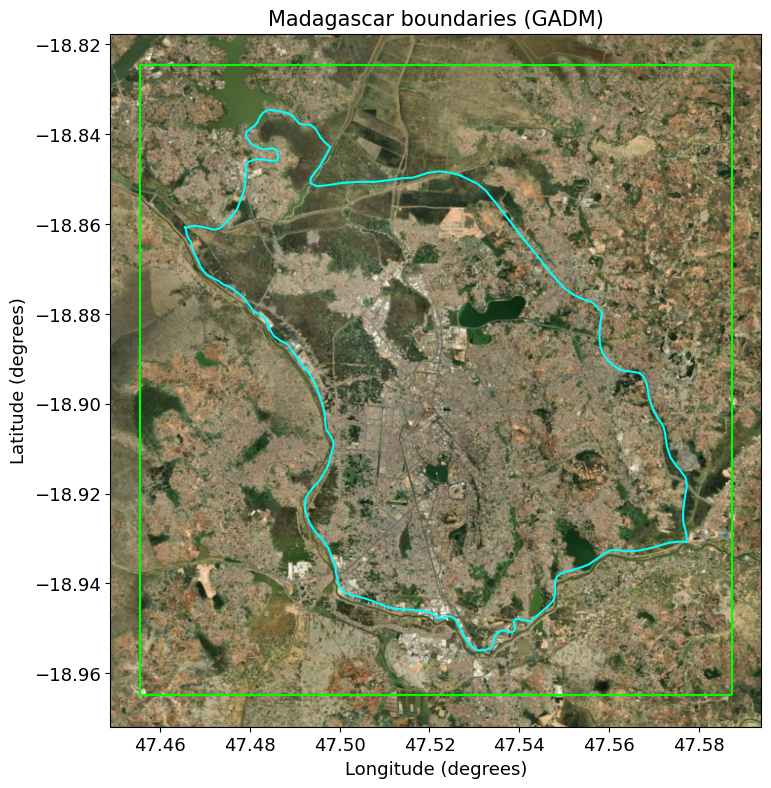

In [8]:
# Call LGA Polygons from GADM API

downloader = GADMDownloader(version='4.0')

country_name = 'Madagascar'
ad_level = 3
gdf_admin = downloader.get_shape_data_by_country_name(country_name=country_name, ad_level=ad_level)
admin3_name = 'Antananarivo renivohitra'
gdf_admin = gdf_admin[gdf_admin['NAME_3']==admin3_name]

# Generate a bounding box with the extents of the AOI
aoi_nickname = 'tana'
gdf_aoi = gpd.GeoDataFrame(geometry=[box(*gdf_admin.total_bounds)])
gdf_aoi['geometry'] = gdf_aoi.buffer(0.01, join_style=2)
aoi_path = f'{root}/{aoi_nickname}.geojson'
gdf_aoi.to_file(aoi_path)
gdf_aoi_bounds = list(gdf_aoi.total_bounds)

# Plot boundaries of the country and bbox

plt.rcParams['font.size'] = 13
fig, ax = plt.subplots(figsize=(15,9))

gdf_admin.boundary.plot(ax=ax, edgecolor='cyan')
gdf_aoi.boundary.plot(ax=ax, color='lime')
cx.add_basemap(ax=ax, crs=4326, source=cx.providers.Esri.WorldImagery, attribution=False)
ax.set_title(label=f'{country_name} boundaries (GADM)', fontsize=15)
ax.set_xlabel('Longitude (degrees)')
ax.set_ylabel('Latitude (degrees)')


# Exposure datasets

## Google Open Buildings

Global Building footprint database.

Source: https://sites.research.google/open-buildings/#download

Text(0.5, 1.0, 'Selected tiles')

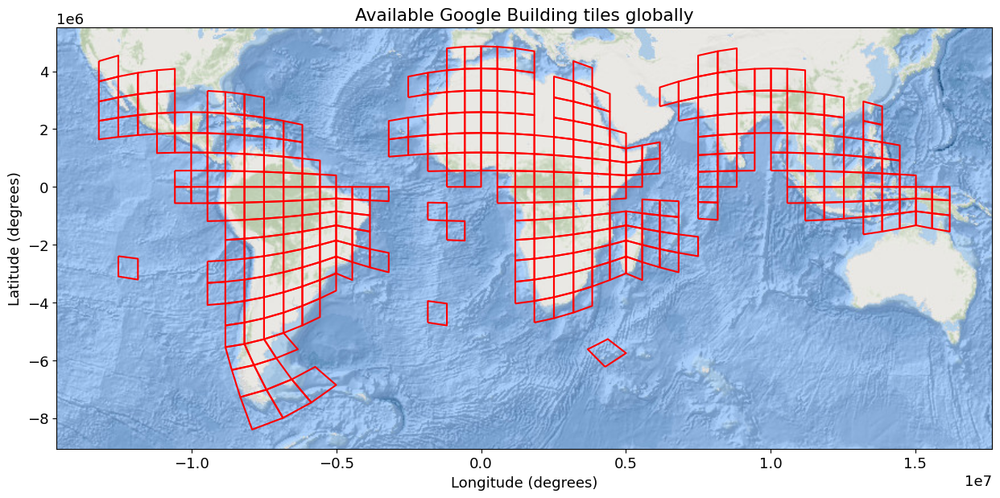

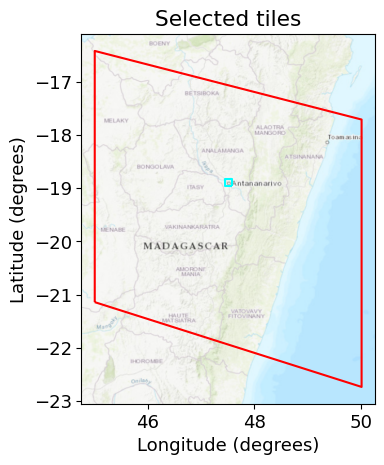

In [4]:
# Read Google Building Tiles

url_tiles = 'https://openbuildings-public-dot-gweb-research.uw.r.appspot.com/public/tiles.geojson'
response = requests.get(url_tiles)
geojson_data = response.json()
gdf_tiles = gpd.GeoDataFrame.from_features(geojson_data['features'], crs=4326)

# Plot Microsoft Buildings available tiles at global scale

fig, ax = plt.subplots(figsize=(15,10))

gdf_tiles.to_crs(3857).boundary.plot(ax=ax, color='red')
cx.add_basemap(ax=ax, source=cx.providers.Esri.OceanBasemap, attribution=False)
ax.set_xlabel('Longitude (degrees)')
ax.set_ylabel('Latitude (degrees)')
ax.set_title('Available Google Building tiles globally')

# Identify tiles intersecting AOI

gdf_aoi_tiles = gpd.sjoin(gdf_tiles, gdf_aoi, predicate='intersects').reset_index(drop=True)

# Plot selected tiles and AOI

fig, ax = plt.subplots()

gdf_aoi_tiles.boundary.plot(ax=ax, color='red')
gdf_aoi.boundary.plot(ax=ax, color='cyan')
cx.add_basemap(ax=ax, crs=4326, source=cx.providers.Esri.WorldTopoMap, attribution=False)
ax.set_xlabel('Longitude (degrees)')
ax.set_ylabel('Latitude (degrees)')
ax.set_title('Selected tiles')

In [6]:
# Download polygons falling within selected tile

t_start = datetime.now()
gdf_buildings_aoi = gpd.GeoDataFrame()

for index, row in gdf_aoi_tiles.iterrows():

    # Download building file
    output_path = f'/Users/aprida/Desktop/{row["tile_id"]}_buildings.csv.gz'
    tile_path = row['tile_url']
    os.system(f'wget -O {output_path} {tile_path}') # Download zip file to local (faster than scrapping the data from url)

    # Read downloaded file with buildings
    df = pd.read_csv(output_path) # Read file with polygons within the preselected tile as dataframe
    df['geometry'] = df['geometry'].apply(wkt.loads) # Convert geometry column to WKT format
    
    # Georeference buildings and crop to polygons of AOI
    gdf_buildings = gpd.GeoDataFrame(df, geometry='geometry') # Read polygons as geodataframe
    gdf_buildings_aoi_tmp = gpd.sjoin(gdf_buildings, gdf_aoi, predicate='intersects').reset_index(drop=True) # Identify buildings within AOI
    
    gdf_buildings_aoi = pd.concat([gdf_buildings_aoi, gdf_buildings_aoi_tmp], axis=0)

    print(index)

print(datetime.now() - t_start)

--2024-06-24 18:44:01--  https://storage.googleapis.com/open-buildings-data/v3/polygons_s2_level_4_gzip/21f_buildings.csv.gz
Resolving storage.googleapis.com (storage.googleapis.com)... 172.217.20.219, 142.250.179.123, 142.250.179.91, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.217.20.219|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 468604051 (447M) [application/octet-stream]
Saving to: ‘/Users/aprida/Desktop/21f_buildings.csv.gz’

     0K .......... .......... .......... .......... ..........  0% 2,61M 2m51s
    50K .......... .......... .......... .......... ..........  0% 2,49M 2m55s
   100K .......... .......... .......... .......... ..........  0% 2,54M 2m55s
   150K .......... .......... .......... .......... ..........  0% 6,30M 2m29s
   200K .......... .......... .......... .......... ..........  0% 3,25M 2m27s
   250K .......... .......... .......... .......... ..........  0% 9,36M 2m10s
   300K .......... .......... .....

0
0:01:41.134934


0:00:54.817336


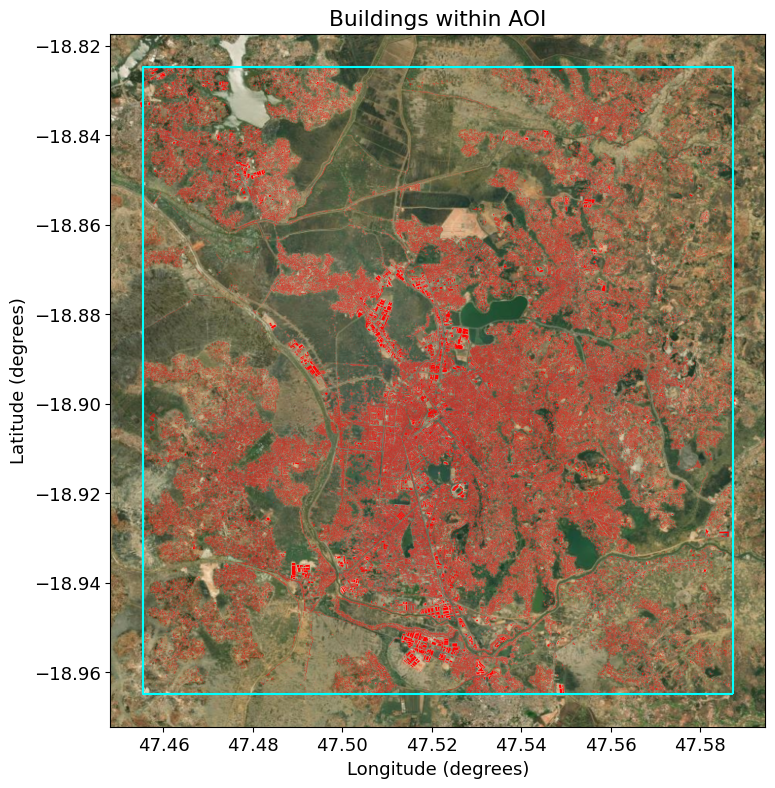

In [7]:
t_start = datetime.now()

# Plot buildings for AOI
fig, ax = plt.subplots(figsize=(15,9))
gdf_buildings_aoi.plot(ax=ax, color='red')
gdf_aoi.boundary.plot(ax=ax, color='cyan')
cx.add_basemap(ax=ax, crs=4326, source=cx.providers.Esri.WorldImagery, attribution=False)
ax.set_xlabel('Longitude (degrees)')
ax.set_ylabel('Latitude (degrees)')
ax.set_title('Buildings within AOI')

print(datetime.now() - t_start)

## Microsoft Buildings

Global Building footprint database.

Source: https://github.com/microsoft/GlobalMLBuildingFootprints/tree/main?tab=readme-ov-file

0:00:34.952104


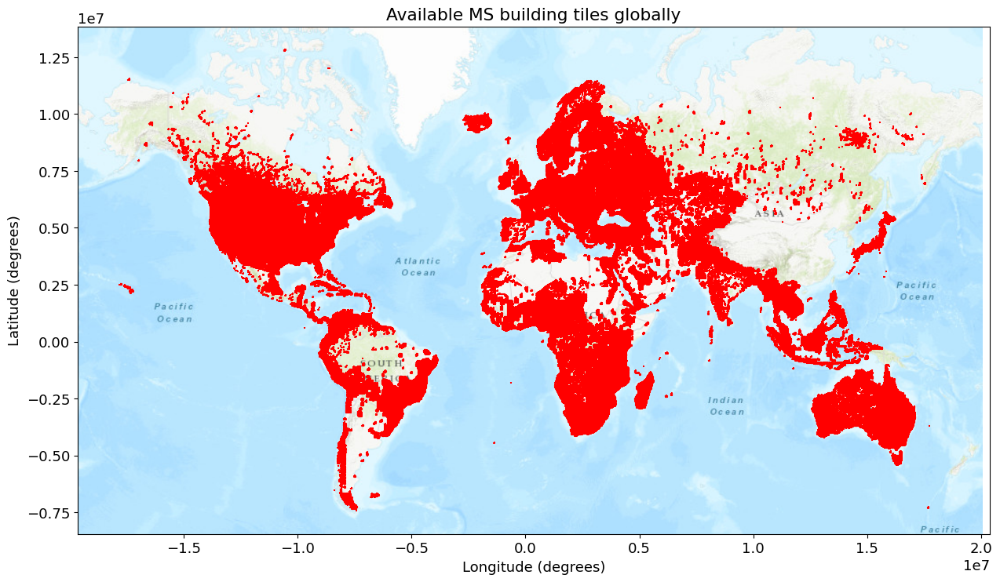

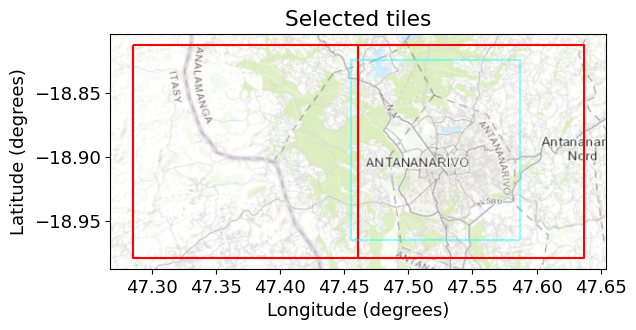

In [17]:
t_start = datetime.now()

# Read MS building Tiles
url_tiles = 'https://minedbuildings.blob.core.windows.net/global-buildings/buildings-coverage.geojson'
response = requests.get(url_tiles)
gdf_tiles = gpd.read_file(io.BytesIO(response.content))

# Plot Microsoft Buildings available tiles at global scale
fig, ax = plt.subplots(figsize=(15,10))
gdf_tiles.to_crs(3857).boundary.plot(ax=ax, color='red')
cx.add_basemap(ax=ax, source=cx.providers.Esri.WorldTopoMap, attribution=False)
ax.set_xlabel('Longitude (degrees)')
ax.set_ylabel('Latitude (degrees)')
ax.set_title('Available MS building tiles globally')

# Identify tiles intersecting AOI
gdf_aoi_tiles = gpd.sjoin(gdf_tiles, gdf_aoi, predicate='intersects').reset_index(drop=True)

# Plot selected tiles and AOI
fig, ax = plt.subplots()
gdf_aoi_tiles.boundary.plot(ax=ax, color='red')
gdf_aoi.boundary.plot(ax=ax, color='cyan', alpha=0.4)
cx.add_basemap(ax=ax, crs=4326, source=cx.providers.Esri.WorldTopoMap, attribution=False)
ax.set_xlabel('Longitude (degrees)')
ax.set_ylabel('Latitude (degrees)')
ax.set_title('Selected tiles')

print(datetime.now() - t_start)

In [11]:
t_start = datetime.now()

# Identify url of identified tiles intersecting AOI
dataset_links = pd.read_csv("https://minedbuildings.blob.core.windows.net/global-buildings/dataset-links.csv")
quadkeys = gdf_aoi_tiles['quadkey'].apply(lambda x: int(str(x)[:-2])).unique() ##### CHECK SELECTION OF STRINGS [:-2], NOT SURE IF CODE CORRECT ########
dataset_links_aoi = dataset_links[dataset_links['QuadKey'].isin(quadkeys)]
print(dataset_links_aoi.to_markdown())

# Download polygons falling within AOI
gdf_buildings = gpd.GeoDataFrame()

for _, row in dataset_links_aoi.iterrows(): # merge buildings within identified tiles
    df = pd.read_json(row.Url, lines=True)
    df['geometry'] = df['geometry'].apply(shape)
    gdf = gpd.GeoDataFrame(df, crs=4326)
    gdf_buildings = pd.concat([gdf_buildings, gdf], ignore_index=True)

gdf_buildings_aoi = gpd.sjoin(gdf_buildings, gdf_aoi, predicate='intersects').reset_index(drop=True) # Identify buildings within AOI
# gdf_buildings_aoi.to_file('/Users/aprida/Documents/Consulting/Private_sector/Keolis/Model_Alvaro/exposure/pols_lyon.geojson') # Save buildings within AOI to file

print(datetime.now() - t_start)

|       | Location   |   QuadKey | Url                                                                                                                                                                                                        | Size   |
|------:|:-----------|----------:|:-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|:-------|
| 15717 | Madagascar | 301022033 | https://minedbuildings.blob.core.windows.net/global-buildings/2024-05-28/global-buildings.geojsonl/RegionName%3DMadagascar/quadkey%3D301022033/part-00155-f7c7c3eb-e50e-4937-b0e3-071fe0699cfb.c000.csv.gz | 37.7MB |
0:00:41.025666


0:00:25.613043


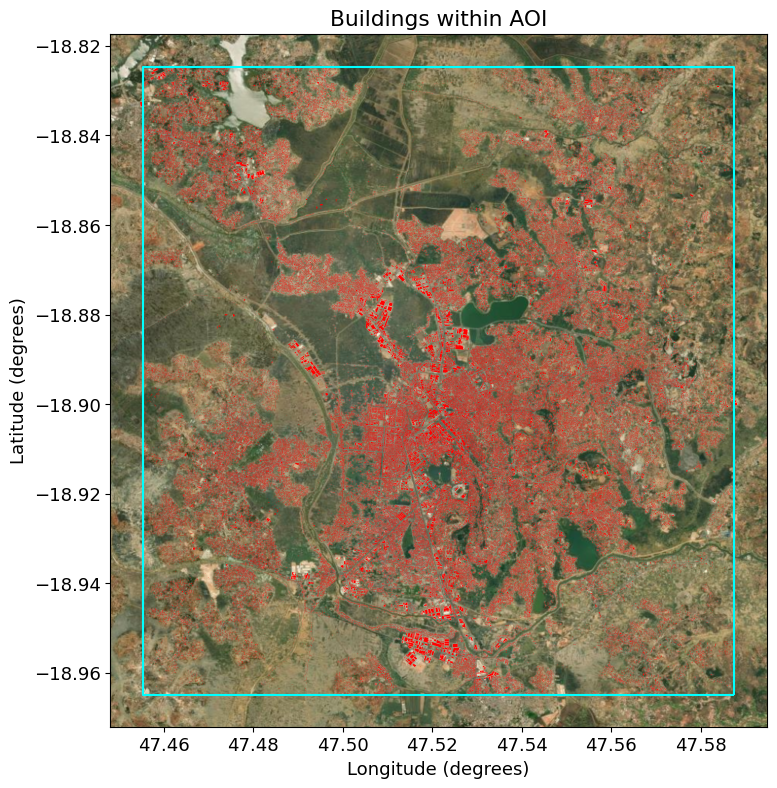

In [12]:
t_start = datetime.now()

# Plot buildings for AOI

fig, ax = plt.subplots(figsize=(15,9))

gdf_buildings_aoi.plot(ax=ax, color='red')
gdf_aoi.boundary.plot(ax=ax, color='cyan')
cx.add_basemap(ax=ax, crs=4326, source=cx.providers.Esri.WorldImagery, attribution=False)
ax.set_xlabel('Longitude (degrees)')
ax.set_ylabel('Latitude (degrees)')
ax.set_title('Buildings within AOI')

print(datetime.now() - t_start)

## WorldPop

Global population counts database, per country.

Source: https://hub.worldpop.org/geodata/summary?id=49697

0:00:09.498165


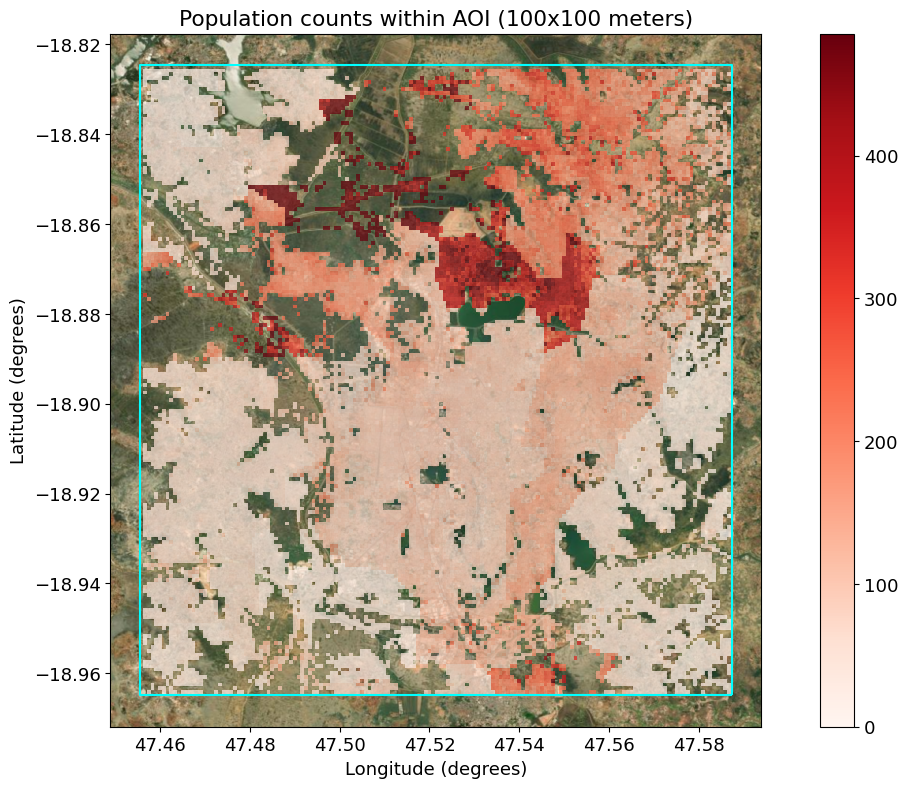

In [23]:
t_start = datetime.now()

# Download raster of population counts in Ethiopia to local
url = 'https://data.worldpop.org/GIS/Population/Global_2000_2020_Constrained/2020/maxar_v1/MDG/mdg_ppp_2020_UNadj_constrained.tif'
filename = f'{root}/mdg_ppp_2020_UNadj_constrained.tif'
response = requests.get(url)

with open(filename, 'wb') as f:
    f.write(response.content)

# Clip raster of population counts to basin polygon
raster = rxr.open_rasterio(filename)
raster.values = np.where(raster.values < 0, 0, raster.values)
raster.rio.to_raster(filename)

filename_output = f'{root}/{aoi_nickname}_ppp_2020_UNadj_constrained.tif'
OutTile = gdal.Warp(destNameOrDestDS = filename_output, # directory output
          srcDSOrSrcDSTab = filename, # directoy input
          cutlineDSName= aoi_path, # vector file
          cropToCutline = True,
                    dstNodata = 0) # Select True
OutTile = None

# Polygonize raster of population counts for the AOI
with rio.open(filename_output) as src:
    
    image = src.read(1)
    mask = image != src.nodata
    results = (
        {'properties': {'popcounts': v}, 'geometry': s}
        for i, (s, v) in enumerate(
            shapes(image, mask=mask, transform=src.transform))
    )
    geoms = list(results)
    gdf_pop = gpd.GeoDataFrame.from_features(geoms, crs=4326)

# Plot buildings for AOI
fig, ax = plt.subplots(figsize=(15,9))
gdf_pop.plot(ax=ax, column='popcounts', cmap='Reds', legend=True, vmin=0, vmax=gdf_pop['popcounts'].quantile(0.98), alpha=0.7)
gdf_aoi.boundary.plot(ax=ax, color='cyan')
cx.add_basemap(ax=ax, crs=4326, source=cx.providers.Esri.WorldImagery, attribution=False)
ax.set_xlabel('Longitude (degrees)')
ax.set_ylabel('Latitude (degrees)')
ax.set_title('Population counts within AOI (100x100 meters)')

print(datetime.now() - t_start)

## Copernicus Land Cover

Global land cover surface, divided into 22 classes.
Source: https://cds.climate.copernicus.eu/cdsapp#!/dataset/satellite-land-cover?tab=overview

In [ ]:
import cdsapi

c = cdsapi.Client()
year = 2022

c.retrieve(
    'satellite-land-cover',
    {
        'variable': 'all',
        'format': 'zip',
        'year': year,
        'version': 'v2.1.1',
    },
    f'{root}/cop_lancover.zip')

|    | description                               |   landuse |
|---:|:------------------------------------------|----------:|
|  0 | cropland_rainfed                          |        10 |
|  1 | cropland_rainfed_herbaceous_cover         |        11 |
|  2 | mosaic_natural_vegetation                 |        40 |
|  3 | tree_broadleaved_evergreen_closed_to_open |        50 |
|  4 | tree_broadleaved_deciduous_closed_to_open |        60 |
|  5 | mosaic_tree_and_shrub                     |       100 |
|  6 | mosaic_herbaceous                         |       110 |
|  7 | tree_cover_flooded_saline_water           |       170 |
|  8 | shrub_or_herbaceous_cover_flooded         |       180 |
|  9 | urban                                     |       190 |
| 10 | water                                     |       210 |


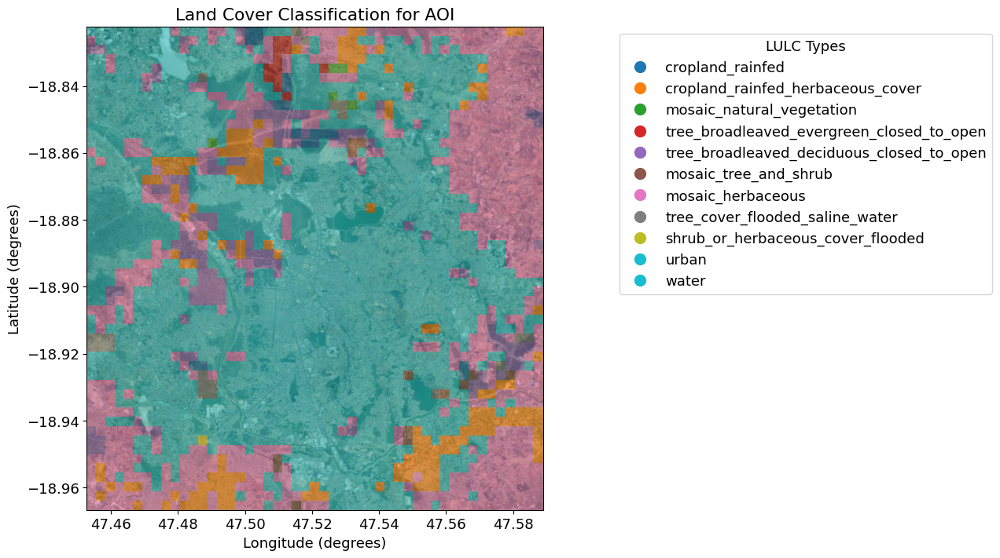

In [35]:
# Define the path to the zip file
zip_file_path = f'{root}/cop_lancover.zip'

# Define the directory where you want to extract the contents
extract_dir = f'{root}/lccs'

# Open the zip file and extract
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract all the contents to the extraction directory
    zip_ref.extractall(extract_dir)

# Read Vito LULC at AOI
lulc_raster = xr.open_dataset(glob.glob(f'{extract_dir}/*.nc')[0])['lccs_class']
lulc_raster.rio.write_crs(4326, inplace=True)
lulc_raster = ds_lulc.rio.clip_box(*gdf_aoi.total_bounds)

# Read Vito LULC table
lulc_types = lulc_raster.to_dataframe(name='lulc').reset_index()['lulc'].unique()
lulc_table = pd.DataFrame({
    'description': lulc_raster.attrs['flag_meanings'].split(),
    'landuse': lulc_raster.attrs['flag_values']
})
lulc_table_filtered = lulc_table[lulc_table['landuse'].isin(lulc_types)].reset_index(drop=True)
print(lulc_table_filtered.to_markdown())

# Define colormap and normalization based on LULC classes
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
cmap = ListedColormap(colors[:len(lulc_table_filtered)])
norm = BoundaryNorm(lulc_table_filtered['landuse'].values, cmap.N)

# Plot LULC
fig, ax = plt.subplots(figsize=(10,8))
lulc_raster.plot(ax=ax, cmap=cmap, norm=norm, add_colorbar=False, alpha=np.where(lulc_raster <= 0, 0, 0.5))
cx.add_basemap(ax=ax, crs=4326, source=cx.providers.Esri.WorldImagery, attribution=False)
ax.set_xlabel('Longitude (degrees)')
ax.set_ylabel('Latitude (degrees)')
ax.set_title('Land Cover Classification for AOI')

# Create legend
legend_labels = lulc_table_filtered[['landuse', 'description']].set_index('landuse').to_dict()['description']
handles = [plt.Line2D([0], [0], marker='o', color=cmap(norm(vito)), linestyle='', markersize=10) for vito in legend_labels.keys()]
ax.legend(handles, legend_labels.values(), title="LULC Types", loc='upper right', bbox_to_anchor=(2, 1))

## Vito Land Cover

Global land cover surface, divided into 22 classes.
Source: Copernicus Global Land Service: Land Cover 100m: collection 3: epoch 2019: Globe: https://zenodo.org/records/3939050

|    |   vito | description                                              |   landuse |     N |
|---:|-------:|:---------------------------------------------------------|----------:|------:|
|  0 |     20 | Shrubs                                                   |        20 | 0.05  |
|  1 |     30 | Herbaceous vegetation                                    |        30 | 0.034 |
|  2 |     40 | Cultivated and managed vegetation/agriculture (cropland) |        40 | 0.037 |
|  3 |     50 | Urban / built up                                         |        50 | 0.1   |
|  4 |     60 | Bare / sparse vegetation                                 |        60 | 0.023 |
|  5 |     80 | Permanent water bodies                                   |        80 | 0.02  |
|  6 |     90 | Herbaceous wetland                                       |        90 | 0.035 |
|  7 |    112 | Closed forest evergreen broad leaf                       |       112 | 0.11  |
|  8 |    122 | Open forest evergreen broad leaf  

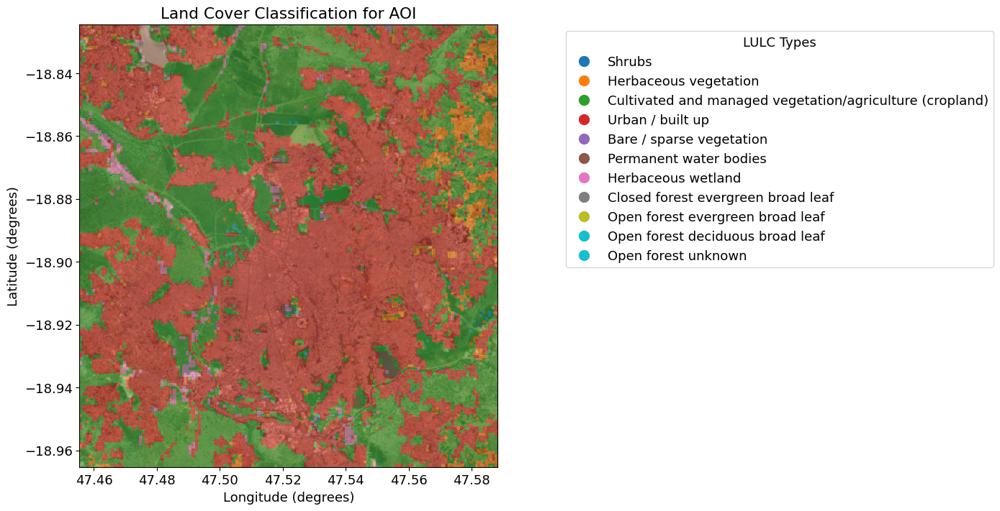

In [33]:
# Read Vito LULC at AOI
lulc_glob_path = 'https://zenodo.org/records/3939050/files/PROBAV_LC100_global_v3.0.1_2019-nrt_Discrete-Classification-map_EPSG-4326.tif'
lulc_raster = rxr.open_rasterio(lulc_glob_path, chunks=True, cache=False, parse_coordinates=True).rio.clip_box(*gdf_aoi.total_bounds)

# Read Vito LULC table
lulc_types = lulc_raster.to_dataframe(name='lulc').reset_index()['lulc'].unique()
lulc_table = pd.read_csv('https://raw.githubusercontent.com/Deltares/hydromt_sfincs/main/hydromt_sfincs/data/lulc/vito_mapping.csv')
# Filter the LULC table for the types present in the raster
lulc_table_filtered = lulc_table[lulc_table['landuse'].isin(lulc_types)].reset_index(drop=True)
print(lulc_table_filtered.to_markdown())

# Define colormap and normalization based on LULC classes
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
cmap = ListedColormap(colors[:len(lulc_table_filtered)])
norm = BoundaryNorm(lulc_table_filtered['landuse'].values, cmap.N)

# Plot LULC
fig, ax = plt.subplots(figsize=(10,8))
lulc_raster.plot(ax=ax, cmap=cmap, norm=norm, add_colorbar=False, alpha=np.where(lulc_raster <= 0, 0, 0.5))
cx.add_basemap(ax=ax, crs=4326, source=cx.providers.Esri.WorldImagery, attribution=False)
ax.set_xlabel('Longitude (degrees)')
ax.set_ylabel('Latitude (degrees)')
ax.set_title('Land Cover Classification for AOI')

# Create legend
legend_labels = lulc_table_filtered[['landuse', 'description']].set_index('landuse').to_dict()['description']
handles = [plt.Line2D([0], [0], marker='o', color=cmap(norm(vito)), linestyle='', markersize=10) for vito in legend_labels.keys()]
ax.legend(handles, legend_labels.values(), title="LULC Types", loc='upper right', bbox_to_anchor=(2.2, 1))

## LitPop

A global high-resolution asset exposure dataset produced using “lit population” (LitPop), a globally consistent methodology to disaggregate asset value data proportional to a combination of nightlight intensity and geographical population data. Exposure data for population, asset values and productive capital at 4km spatial resolution globally, consistent across country borders. The dataset offers value for manifold use cases, including globally consistent economic disaster risk assessments and climate change adaptation studies, especially for larger regions, yet at considerably high resolution.

In [19]:
### An Earth Data account is required: https://urs.earthdata.nasa.gov/

# Give access credentials to NASA EarthData portal
user = getpass.getpass(prompt = 'Enter NASA Earthdata Login Username: ')      # Input NASA Earthdata Login Username
password = getpass.getpass(prompt = 'Enter NASA Earthdata Login Password: ')  # Input NASA Earthdata Login Password

# Call API and extract token
api = 'https://appeears.earthdatacloud.nasa.gov/api/'  # Set the AρρEEARS API to a variable
token_response = requests.post('{}login'.format(api), auth=(user, password)).json() # Insert API URL, call login service, provide credentials & return json
del user, password                                                           # Remove user and password information
token = token_response['token']                      # Save login token to a variable
head = {'Authorization': 'Bearer {}'.format(token)}  # Create a header to store token information, needed to submit a request

Enter NASA Earthdata Login Username:  ········
Enter NASA Earthdata Login Password:  ········


In [20]:
t_start = datetime.now()

# Create the extraction directory if it doesn't exist
root_dir_climada = '/Users/aprida/climada' # Change based on the location of your climada directory
extract_dir = f'{root_dir_climada}/data/gpw-v4-population-count-rev11_2020_30_sec_tif' # Do not change
os.makedirs(extract_dir, exist_ok=True)
zip_filename = f'{root}/file.zip'

# URL of the zip file you want to download
url = 'https://sedac.ciesin.columbia.edu/downloads/data/gpw-v4/gpw-v4-population-count-rev11/gpw-v4-population-count-rev11_2020_30_sec_tif.zip'

with requests.get(url) as response:
    with open(zip_filename, 'wb') as file:
        for chunk in response.iter_content(chunk_size=8192): 
            file.write(chunk)

# Decompress .zip file
with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print(datetime.now() - t_start)

0:02:24.793254


In [ ]:
# Load exposure -> can also be created from a raster file https://climada-python.readthedocs.io/en/latest/tutorial/climada_entity_Exposures.html
pt_exp = LitPop()
# pt_exp.set_country('MDG', res_arcsec=30, reference_year=2017) # this might take a minute while
pt_exp.set_custom_shape(gdf_aoi.geometry[0], total_value=None, reference_year=2018)
raster_path = f'{root}/test.tif'
pt_exp.write_raster(raster_path)
raster_litpop = rxr.open_rasterio(raster_path)

# Plot buildings for AOI
fig, ax = plt.subplots(figsize=(15,9))
raster_litpop.plot(ax=ax, cmap='Reds', vmin=0, vmax=raster_litpop.quantile(0.98), alpha=0.7)
cx.add_basemap(ax=ax, crs=4326, source=cx.providers.Esri.WorldImagery, attribution=False)
ax.set_xlabel('Longitude (degrees)')
ax.set_ylabel('Latitude (degrees)')
ax.set_title('Economic Value (USD) within AOI')


## OpenStreetMap

In [ ]:
### Identify streams in AOI

# Define a bounding box (latitude, longitude)
bbox = list(gdf_aoi.total_bounds)
bbox = [round(x, 3) for x in bbox]

# Use osmnx to extract OSM attributes
gdf_osm = ox.geometries_from_bbox(bbox[3], bbox[1], bbox[2], bbox[0], tags={'waterway': True})

# Print the extracted data
gdf_osm = gdf_osm.reset_index()
gdf_osm_aoi = gpd.clip(gdf_osm, gdf_aoi).reset_index(drop=True)
geom_types = ['LineString']
gdf_osm_aoi = gdf_osm_aoi[gdf_osm_aoi['geometry'].geom_type.isin(geom_types)]
gdf_osm_aoi = gdf_osm_aoi[gdf_osm_aoi['element_type']=='way']
# gdf_osm_aoi[['name', 'waterway', 'geometry']].to_file(f'{root}/rivers_osm.geojson')

# Plot
fig, ax = plt.subplots(figsize=(15,9))

gdf_osm_aoi.plot(ax=ax, color='cyan')
gdf_aoi.boundary.plot(ax=ax, edgecolor='blue', linewidth=3, zorder=1)
cx.add_basemap(ax=ax, crs=4326, source=cx.providers.Esri.WorldImagery, attribution=False)
ax.set_title(label='Rivers in AOI (OSM)', fontsize=15)
ax.set_xlabel('Longitude (degrees)')
ax.set_ylabel('Latitude (degrees)')

/var/folders/db/vmw93gtd7t11kkmyygkr8czh0000gn/T/ipykernel_65890/100234835.py:8: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  gdf_osm = ox.geometries_from_bbox(bbox[3], bbox[1], bbox[2], bbox[0], tags={'amenity': 'school'})
/var/folders/db/vmw93gtd7t11kkmyygkr8czh0000gn/T/ipykernel_65890/100234835.py:12: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4326
Right CRS: None

  gdf_osm_aoi = gpd.clip(gdf_osm, gdf_aoi).reset_index(drop=True)


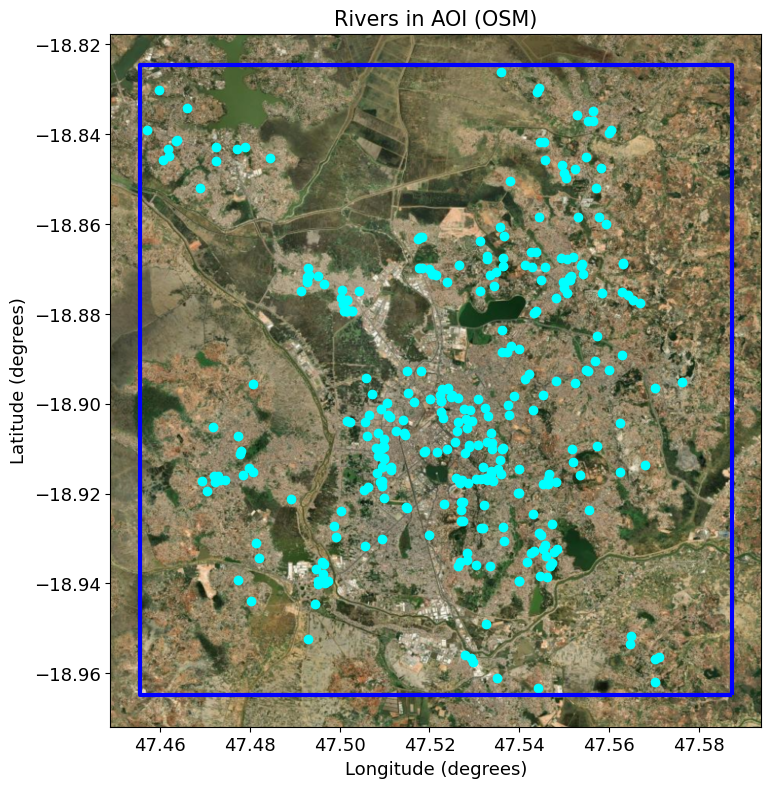

In [17]:
### Identify streams in AOI

# Define a bounding box (latitude, longitude)
bbox = list(gdf_aoi.total_bounds)
bbox = [round(x, 3) for x in bbox]

# Use osmnx to extract OSM attributes
gdf_osm = ox.geometries_from_bbox(bbox[3], bbox[1], bbox[2], bbox[0], tags={'amenity': 'school'})

# Print the extracted data
gdf_osm = gdf_osm.reset_index()
gdf_osm_aoi = gpd.clip(gdf_osm, gdf_aoi).reset_index(drop=True)
geom_types = ['Point']
gdf_osm_aoi = gdf_osm_aoi[gdf_osm_aoi['geometry'].geom_type.isin(geom_types)]
# gdf_osm_aoi = gdf_osm_aoi[gdf_osm_aoi['element_type']=='way']
# gdf_osm_aoi[['name', 'waterway', 'geometry']].to_file(f'{root}/rivers_osm.geojson')

# Plot
fig, ax = plt.subplots(figsize=(15,9))

gdf_osm_aoi.plot(ax=ax, color='cyan')
gdf_aoi.boundary.plot(ax=ax, edgecolor='blue', linewidth=3, zorder=1)
cx.add_basemap(ax=ax, crs=4326, source=cx.providers.Esri.WorldImagery, attribution=False)
ax.set_title(label='Rivers in AOI (OSM)', fontsize=15)
ax.set_xlabel('Longitude (degrees)')
ax.set_ylabel('Latitude (degrees)')

fn = 'points_schools_Antananarivo_renivohitra.geojson'
gdf_osm_aoi.to_file(f'{root}/{fn}')